# Object Detection with KerasCV

**Author:** [lukewood](https://twitter.com/luke_wood_ml), Ian Stenbit, Tirth Patel<br>
**Date created:** 2023/04/08<br>
**Last modified:** 2023/08/10<br>
**Description:** Train an object detection model with KerasCV.

KerasCV offers a complete set of production grade APIs to solve object detection
problems.
These APIs include object-detection-specific
data augmentation techniques, Keras native COCO metrics, bounding box format
conversion utilities, visualization tools, pretrained object detection models,
and everything you need to train your own state of the art object detection
models!

Let's give KerasCV's object detection API a spin.

In [1]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras  # Upgrade to Keras 3.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 4.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.3.3 which is incompatible.


In [2]:
import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

## Object detection introduction

Object detection is the process of identifying, classifying,
and localizing objects within a given image.  Typically, your inputs are
images, and your labels are bounding boxes with optional class
labels.
Object detection can be thought of as an extension of classification, however
instead of one class label for the image, you must detect and localize an
arbitrary number of classes.

**For example:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

The data for the above image may look something like this:
```python
image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 is an arbitrary class ID representing "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # bounding box is in "rel_xywh" format
   # so 0.25 represents the start of the bounding box 25% of
   # the way across the image.
   # The .15 represents that the width is 15% of the image width.
}
```

Since the inception of [*You Only Look Once*](https://arxiv.org/abs/1506.02640)
(aka YOLO),
object detection has primarily been solved using deep learning.
Most deep learning architectures do this by cleverly framing the object detection
problem as a combination of many small classification problems and
many regression problems.

More specifically, this is done by generating many anchor boxes of varying
shapes and sizes across the input images and assigning them each a class label,
as well as `x`, `y`, `width` and `height` offsets.
The model is trained to predict the class labels of each box, as well as the
`x`, `y`, `width`, and `height` offsets of each box that is predicted to be an
object.

**Visualization of some sample anchor boxes**:

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Objection detection is a technically complex problem but luckily we offer a
bulletproof approach to getting great results.
Let's do this!

## Perform detections with a pretrained model

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)

The highest level API in the KerasCV Object Detection API is the `keras_cv.models` API.
This API includes fully pretrained object detection models, such as
`keras_cv.models.YOLOV8Detector`.

Let's get started by constructing a YOLOV8Detector pretrained on the `pascalvoc`
dataset.

In [3]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

100%|██████████| 2.27k/2.27k [00:00<00:00, 2.27MB/s]
100%|██████████| 99.5M/99.5M [00:03<00:00, 31.8MB/s]


Notice the `bounding_box_format` argument?

Recall in the section above, the format of bounding boxes:

```
bounding_boxes = {
  "classes": [num_boxes],
  "boxes": [num_boxes, 4]
}
```

This argument describes *exactly* what format the values in the `"boxes"`
field of the label dictionary take in your pipeline.
For example, a box in `xywh` format with its top left corner at the coordinates
(100, 100) with a width of 55 and a height of 70 would be represented by:
```
[100, 100, 55, 75]
```

or equivalently in `xyxy` format:

```
[100, 100, 155, 175]
```

While this may seem simple, it is a critical piece of the KerasCV object
detection API!
Every component that processes bounding boxes requires a
`bounding_box_format` argument.
You can read more about
KerasCV bounding box formats [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).


This is done because there is no one correct format for bounding boxes!
Components in different pipelines expect different formats, and so by requiring
them to be specified we ensure that our components remain readable, reusable,
and clear.
Box format conversion bugs are perhaps the most common bug surface in object
detection pipelines - by requiring this parameter we mitigate against these
bugs (especially when combining code from many sources).

Next let's load an image:

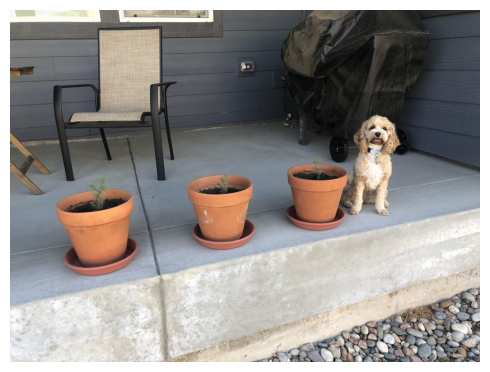

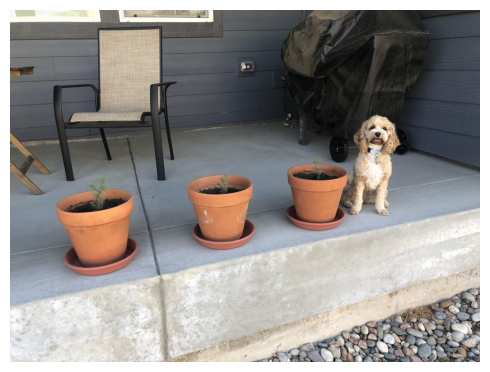

In [7]:
from PIL import Image
image = Image.open('/content/gCNcJJI.jpeg')
image.show()

# filepath = keras.utils.get_file(origin="https://i.imgur.com/gCNcJJI.jpg")
# image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

# https://timeweb.com/ru/community/articles/obrabotka-i-generaciya-izobrazheniy-v-python-biblioteka-pillow#:~:text=Для%20просмотра%20основной%20информации%20об,jpg')%20print(img.

# OFF VPN
# https://mavink.com/explore/Keras-Image-Net
# Не удаётся установить соединение с сайтом.
# Превышено время ожидания ответа от сайта mavink.com.
# Попробуйте сделать следующее:

# https://i.imgur.com/gCNcJJI.jpg

# Downloading data from https://i.imgur.com/gCNcJJI.jpg
# ---------------------------------------------------------------------------
# HTTPError                                 Traceback (most recent call last)
# /usr/local/lib/python3.10/dist-packages/keras/src/utils/file_utils.py in get_file(fname, origin, untar, md5_hash, file_hash, cache_subdir, hash_algorithm, extract, archive_format, cache_dir, force_download)
#     290             try:
# --> 291                 urlretrieve(origin, fpath, DLProgbar())
#     292             except urllib.error.HTTPError as e:

# 8 frames
# HTTPError: HTTP Error 429: Unknown Error

# During handling of the above exception, another exception occurred:

# Exception                                 Traceback (most recent call last)
# /usr/local/lib/python3.10/dist-packages/keras/src/utils/file_utils.py in get_file(fname, origin, untar, md5_hash, file_hash, cache_subdir, hash_algorithm, extract, archive_format, cache_dir, force_download)
#     291                 urlretrieve(origin, fpath, DLProgbar())
#     292             except urllib.error.HTTPError as e:
# --> 293                 raise Exception(error_msg.format(origin, e.code, e.msg))
#     294             except urllib.error.URLError as e:
#     295                 raise Exception(error_msg.format(origin, e.errno, e.reason))

# Exception: URL fetch failure on https://i.imgur.com/gCNcJJI.jpg: 429 -- Unknown Error

To use the `YOLOV8Detector` architecture with a ResNet50 backbone, you'll need to
resize your image to a size that is divisible by 64.  This is to ensure
compatibility with the number of downscaling operations done by the convolution
layers in the ResNet.

If the resize operation distorts
the input's aspect ratio, the model will perform signficantly poorer.  For the
pretrained `"yolo_v8_m_pascalvoc"` preset we are using, the final
`MeanAveragePrecision` on the `pascalvoc/2012` evaluation set drops to `0.15`
from `0.38` when using a naive resizing operation.

Additionally, if you crop to preserve the aspect ratio as you do in classification
your model may entirely miss some bounding boxes.  As such, when running inference
on an object detection model we recommend the use of padding to the desired size,
while resizing the longest size to match the aspect ratio.

KerasCV makes resizing properly easy; simply pass `pad_to_aspect_ratio=True` to
a `keras_cv.layers.Resizing` layer.

This can be implemented in one line of code:

In [9]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

This can be used as our inference preprocessing pipeline:

In [10]:
image_batch = inference_resizing([image])

`keras_cv.visualization.plot_bounding_box_gallery()` supports a `class_mapping`
parameter to highlight what class each box was assigned to.  Let's assemble a
class mapping now.

In [11]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

Just like any other `keras.Model` you can predict bounding boxes using the
`model.predict()` API.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


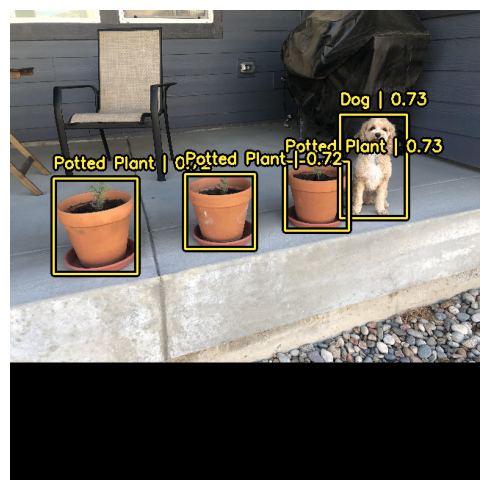

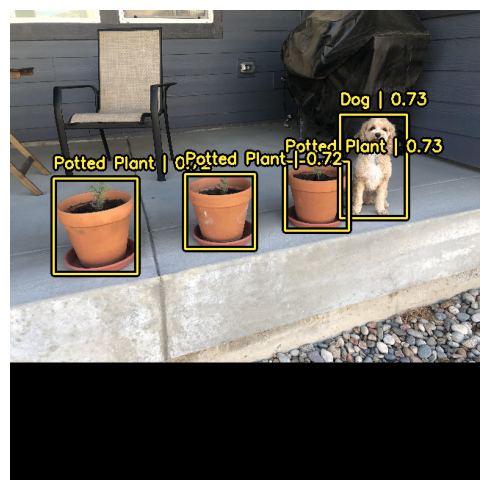

In [29]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

In order to support this easy and intuitive inference workflow, KerasCV
performs non-max suppression inside of the `YOLOV8Detector` class.
Non-max suppression is a traditional computing algorithm that solves the problem
of a model detecting multiple boxes for the same object.

Non-max suppression is a highly configurable algorithm, and in most cases you
will want to customize the settings of your model's non-max
suppression operation.
This can be done by overriding to the `prediction_decoder` argument.

To show this concept off, let's temporarily disable non-max suppression on our
YOLOV8Detector.  This can be done by writing to the `prediction_decoder` attribute.

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


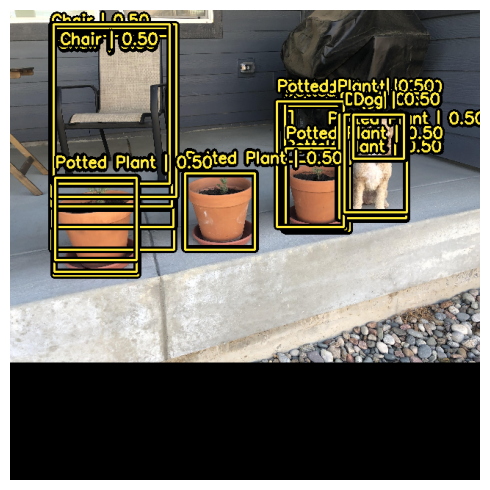

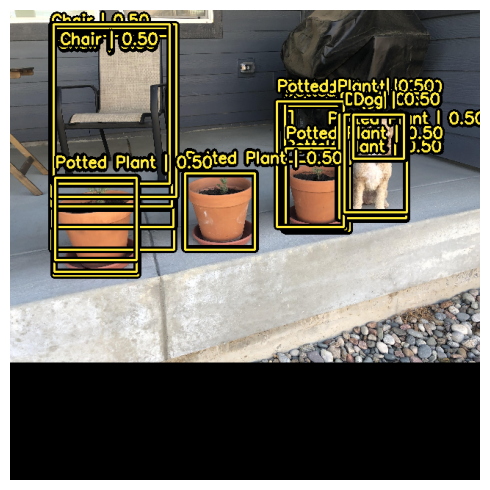

In [13]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)


Next, let's re-configure `keras_cv.layers.NonMaxSuppression` for our
use case!
In this case, we will tune the `iou_threshold` to `0.2`, and the
`confidence_threshold` to `0.7`.

Raising the `confidence_threshold` will cause the model to only output boxes
that have a higher confidence score. `iou_threshold` controls the threshold of
intersection over union (IoU) that two boxes must have in order for one to be
pruned out.
[More information on these parameters may be found in the TensorFlow API docs](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


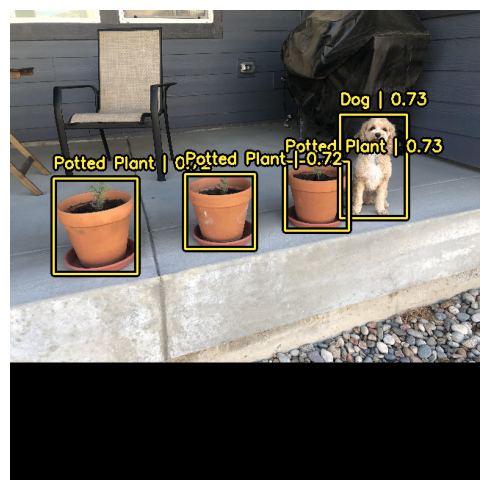

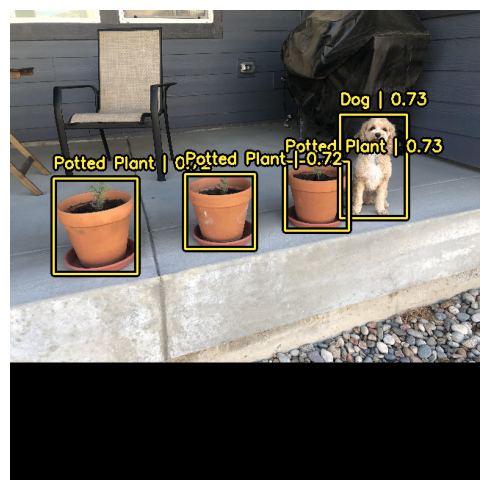

In [14]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

That looks a lot better!

## Train a custom object detection model

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Whether you're an object detection amateur or a well seasoned veteran, assembling
an object detection pipeline from scratch is a massive undertaking.
Luckily, all KerasCV object detection APIs are built as modular components.
Whether you need a complete pipeline, just an object detection model, or even
just a conversion utility to transform your boxes from `xywh` format to `xyxy`,
KerasCV has you covered.

In this guide, we'll assemble a full training pipeline for a KerasCV object
detection model.  This includes data loading, augmentation, metric evaluation,
and inference!

To get started, let's sort out all of our imports and define global
configuration parameters.

In [15]:
BATCH_SIZE = 4

## Data loading

To get started, let's discuss data loading and bounding box formatting.
KerasCV has a predefined format for bounding boxes.
To comply with this, you
should package your bounding boxes into a dictionary matching the
specification below:

```
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```

`bounding_boxes['boxes']` contains the coordinates of your bounding box in a KerasCV
supported `bounding_box_format`.
KerasCV requires a `bounding_box_format` argument in all components that process
bounding boxes.
This is done to maximize your ability to plug and play individual components
into their object detection pipelines, as well as to make code self-documenting
across object detection pipelines.

To match the KerasCV API style, it is recommended that when writing a
custom data loader, you also support a `bounding_box_format` argument.
This makes it clear to those invoking your data loader what format the bounding boxes
are in.
In this example, we format our boxes to `xywh` format.

For example:

```python
train_ds, ds_info = your_data_loader.load(
    split='train', bounding_box_format='xywh', batch_size=8
)
```

This clearly yields bounding boxes in the format `xywh`.  You can read more about
KerasCV bounding box formats [in the API docs](https://keras.io/api/keras_cv/bounding_box/formats/).

Our data comes loaded into the format
`{"images": images, "bounding_boxes": bounding_boxes}`.  This format is
supported in all KerasCV preprocessing components.

Let's load some data and verify that the data looks as we expect it to.

In [16]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}


def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds


train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...:   0%|          | 0/4952 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete59FILC/voc-test.tfrecord*...:   0%|          | 0/…

Generating train examples...:   0%|          | 0/2501 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete59FILC/voc-train.tfrecord*...:   0%|          | 0…

Generating validation examples...:   0%|          | 0/2510 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/voc/2007/4.0.0.incomplete59FILC/voc-validation.tfrecord*...:   0%|        …

Dataset voc downloaded and prepared to /root/tensorflow_datasets/voc/2007/4.0.0. Subsequent calls will reuse this data.


Next, let's batch our data.

In KerasCV object detection tasks it is recommended that
users use ragged batches of inputs.
This is due to the fact that images may be of different sizes in PascalVOC,
as well as the fact that there may be different numbers of bounding boxes per
image.

To construct a ragged dataset in a `tf.data` pipeline, you can use the
`ragged_batch()` method.

In [17]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

Let's make sure our dataset is following the format KerasCV expects.
By using the `visualize_dataset()` function, you can visually verify
that your data is in the format that KerasCV expects.  If the bounding boxes
are not visible or are visible in the wrong locations that is a sign that your
data is mis-formatted.

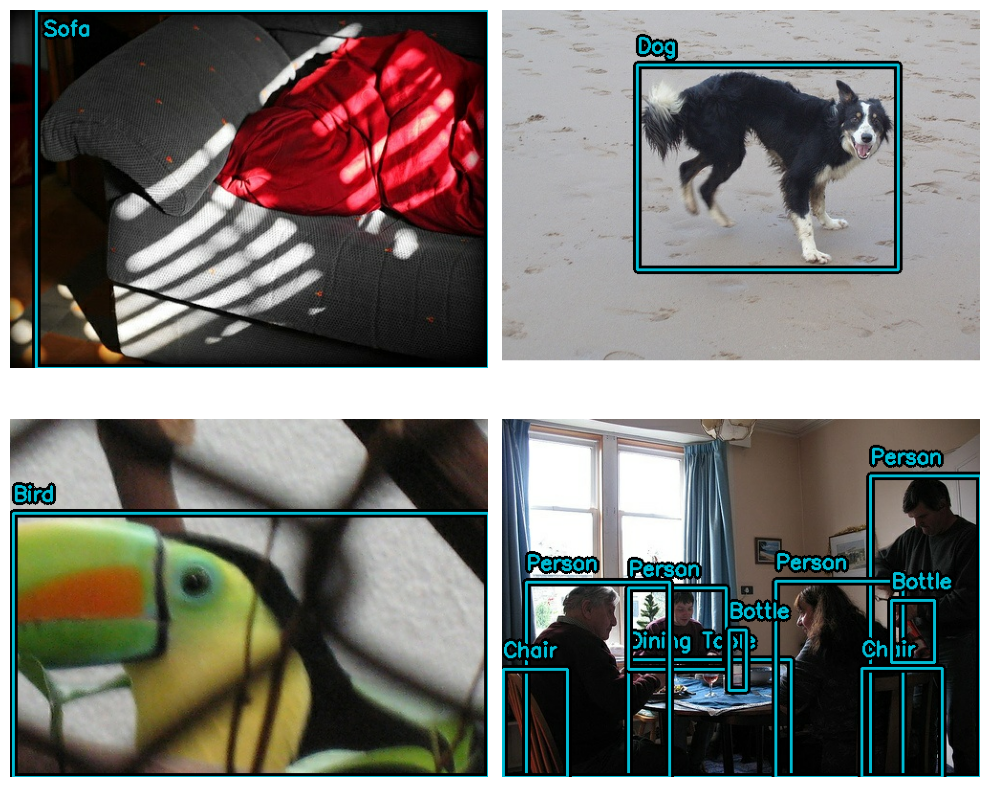

In [18]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

And for the eval set:

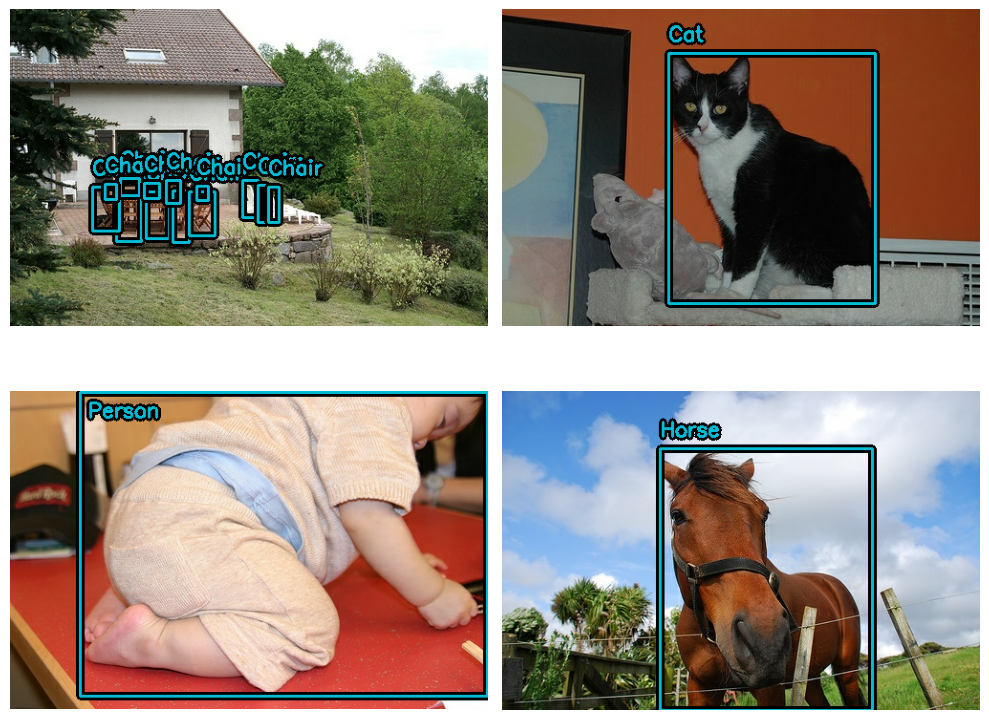

In [19]:
visualize_dataset(
    eval_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    # If you are not running your experiment on a local machine, you can also
    # make `visualize_dataset()` dump the plot to a file using `path`:
    # path="eval.png"
)

Looks like everything is structured as expected.
Now we can move on to constructing our
data augmentation pipeline.

## Data augmentation

One of the most challenging tasks when constructing object detection
pipelines is data augmentation.  Image augmentation techniques must be aware of the underlying
bounding boxes, and must update them accordingly.

Luckily, KerasCV natively supports bounding box augmentation with its extensive
library
of [data augmentation layers](https://keras.io/api/keras_cv/layers/preprocessing/).
The code below loads the Pascal VOC dataset, and performs on-the-fly,
bounding-box-friendly data augmentation inside a `tf.data` pipeline.

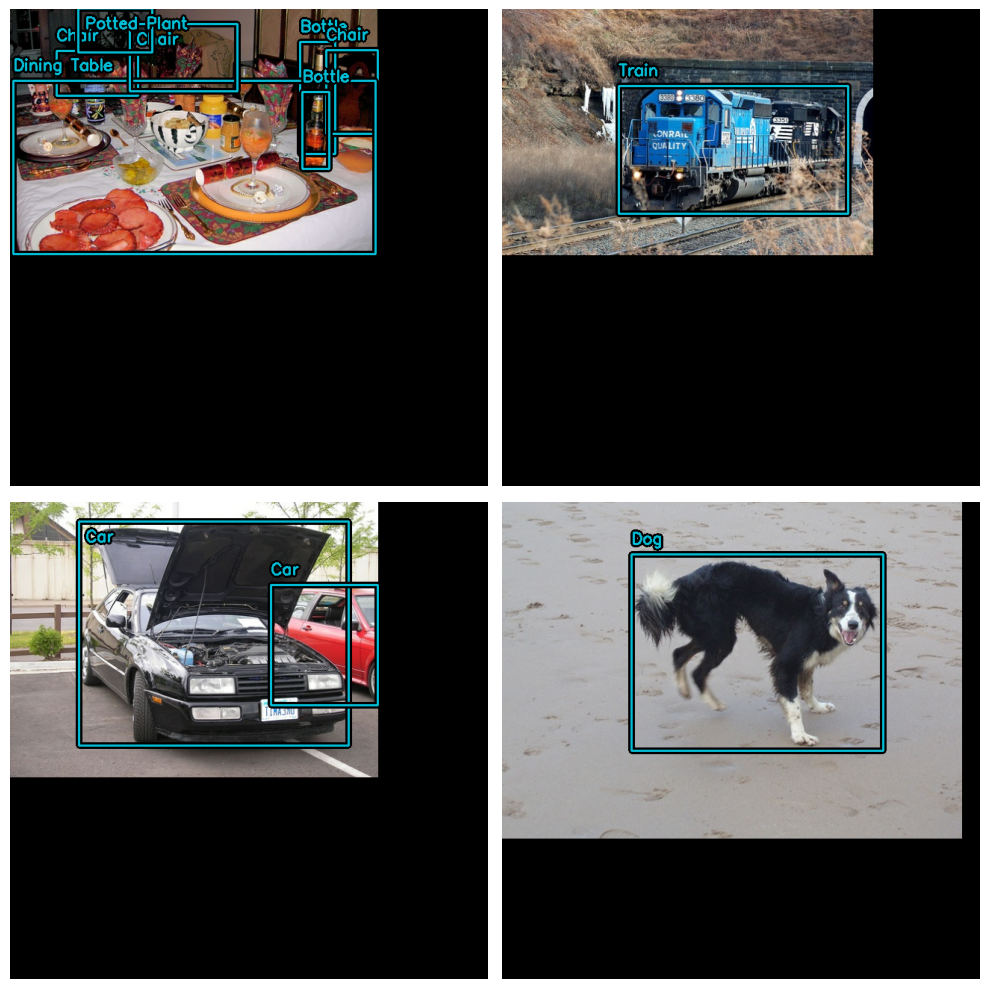

In [20]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
    ),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)

train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Great! We now have a bounding-box-friendly data augmentation pipeline.
Let's format our evaluation dataset to match.  Instead of using
`JitteredResize`, let's use the deterministic `keras_cv.layers.Resizing()`
layer.

In [21]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

Due to the fact that the resize operation differs between the train dataset,
which uses `JitteredResize()` to resize images, and the inference dataset, which
uses `layers.Resizing(pad_to_aspect_ratio=True)`, it is good practice to
visualize both datasets:

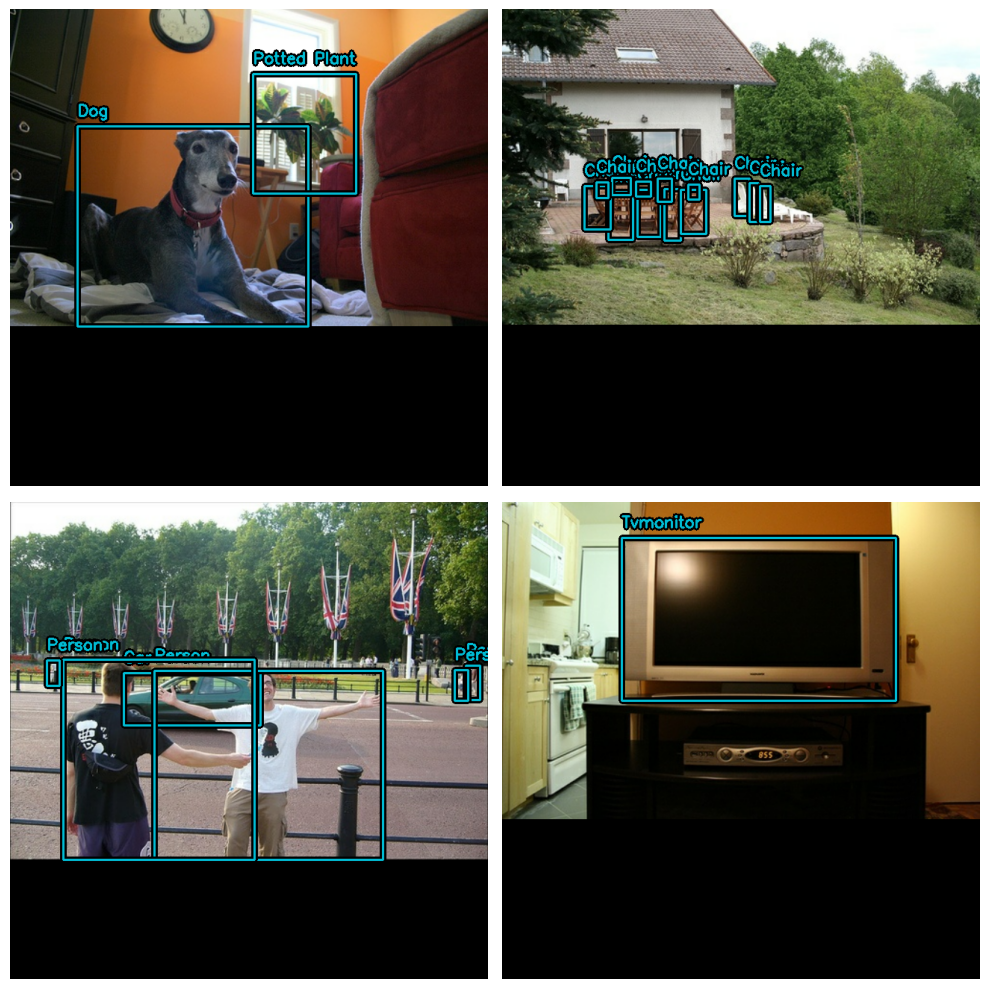

In [22]:
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Finally, let's unpackage our inputs from the preprocessing dictionary, and
prepare to feed the inputs into our model.  In order to be TPU compatible,
bounding box Tensors need to be `Dense` instead of `Ragged`.

In [23]:

def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

# Test 1

# Original 1

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


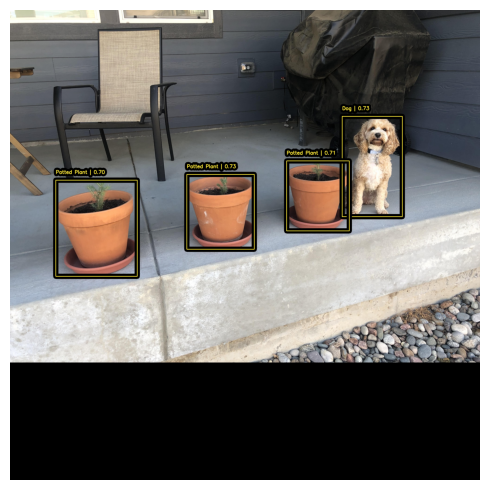

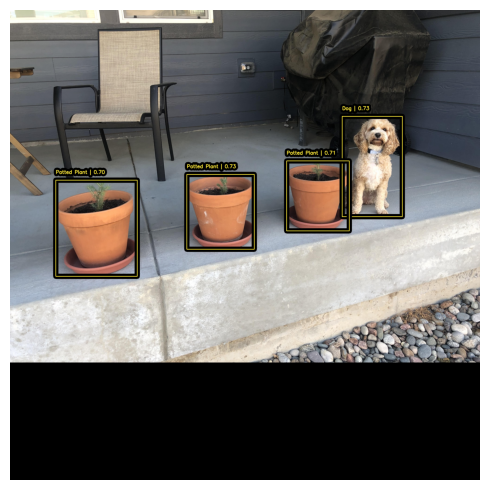

In [141]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

# Primer 1

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7281444072723389 11 Dog
0.727109432220459 15 Potted Plant
0.7050243020057678 15 Potted Plant
0.7004843354225159 15 Potted Plant
0.5318573713302612 8 Chair
0.5154783725738525 4 Bottle
0.5114299654960632 4 Bottle
0.5054288506507874 0 Aeroplane
0.5050075054168701 4 Bottle
0.5041091442108154 4 Bottle
0.5037543773651123 4 Bottle
0.5033497214317322 2 Bird
0.502078652381897 2 Bird
0.5013993382453918 4 Bottle
0.5013133883476257 11 Dog
0.5012775659561157 16 Sheep
0.5009655952453613 4 Bottle
0.5008058547973633 4 Bottle
0.5008001327514648 16 Sheep
0.5007351636886597 0 Aeroplane
0.5006474852561951 4 Bottle
0.5005995035171509 2 Bird
0.5005491375923157 11 Dog
0.5005360841751099 0 Aeroplane
0.5004328489303589 4 Bottle
0.5003396272659302 4 Bottle
0.5003268718719482 2 Bird
0.5002710223197937 15 Potted Plant
0.5002520680427551 4 Bottle
0.5002090334892273 2 Bird
0.5001956224441528 15 Potted Plant
0.5001915693283081 12 Horse
0.500188410282135 16 Sheep
0.50017178058624

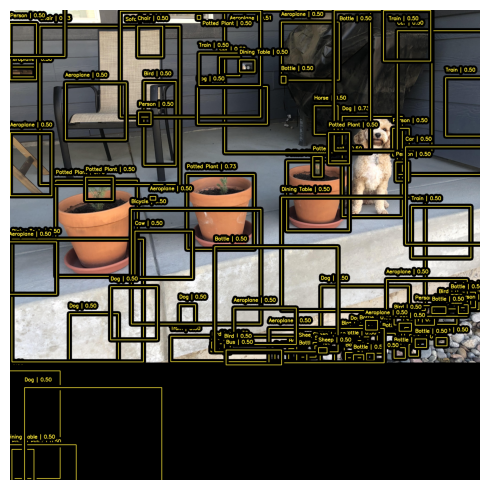

In [142]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2,
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.2, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

# dict_keys(['boxes', 'classes', 'confidence', 'num_detections'])
# test1 = y_pred.get('confidence')
# test1

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 2

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7281444072723389 11 Dog
0.727109432220459 15 Potted Plant
0.7050243020057678 15 Potted Plant
0.7004843354225159 15 Potted Plant
0.5318573713302612 8 Chair


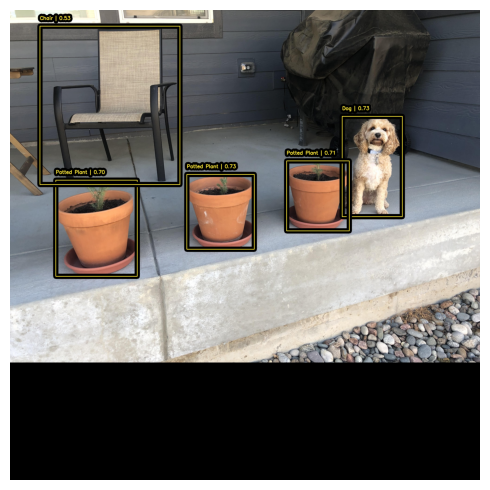

In [143]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.52, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 3

In [144]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7065445184707642 15 Potted Plant
0.6765194535255432 8 Chair
0.5506147742271423 8 Chair
0.5356166362762451 15 Potted Plant


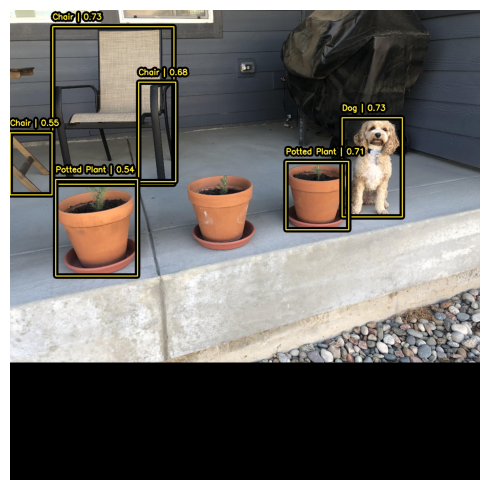

In [145]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.52, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 4

In [146]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7065445184707642 15 Potted Plant


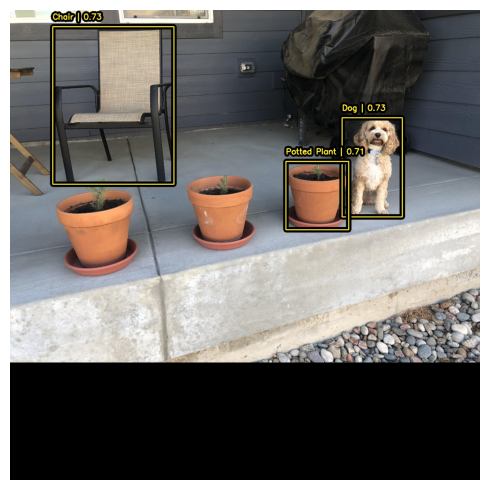

In [147]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 5

In [148]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7065445184707642 15 Potted Plant
0.6936407685279846 15 Potted Plant
0.6765194535255432 8 Chair
0.6357654333114624 8 Chair
0.6145841479301453 11 Dog
0.5862176418304443 8 Chair
0.5753023028373718 15 Potted Plant
0.5506147742271423 8 Chair
0.5356166362762451 15 Potted Plant
0.5168814063072205 11 Dog
0.5156806707382202 15 Potted Plant
0.5140000581741333 15 Potted Plant
0.5138081312179565 15 Potted Plant
0.5125460028648376 15 Potted Plant
0.5104082822799683 8 Chair


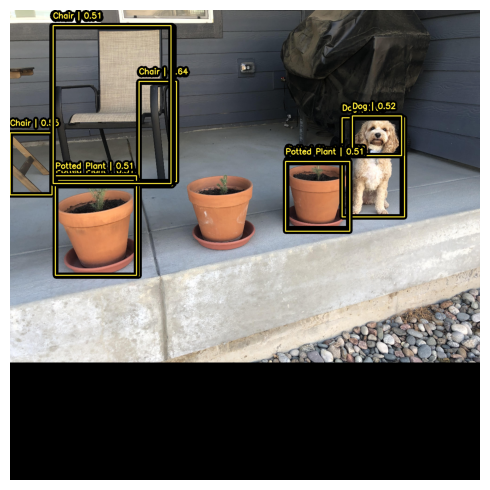

In [149]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.97, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.51, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 6

In [150]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7065445184707642 15 Potted Plant
0.6765194535255432 8 Chair
0.5506147742271423 8 Chair
0.5356166362762451 15 Potted Plant
0.505652129650116 15 Potted Plant


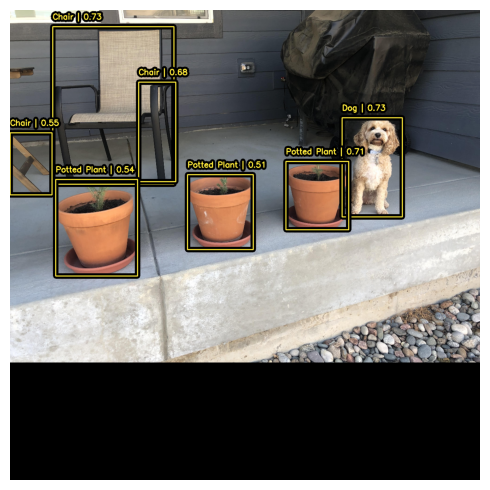

In [151]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 7

In [152]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7256297469139099 8 Chair
0.724902868270874 11 Dog
0.7248806953430176 8 Chair
0.724747359752655 11 Dog
0.7247290015220642 11 Dog
0.7217016816139221 11 Dog
0.7203531265258789 8 Chair
0.7199711799621582 8 Chair
0.7193955779075623 8 Chair
0.7157702445983887 11 Dog
0.7065445184707642 15 Potted Plant
0.7029543519020081 15 Potted Plant
0.7012025713920593 15 Potted Plant
0.698747456073761 8 Chair
0.6936407685279846 15 Potted Plant
0.6829439401626587 11 Dog
0.6800197958946228 8 Chair
0.6795817613601685 15 Potted Plant
0.6780174970626831 15 Potted Plant
0.6765194535255432 8 Chair
0.6664711833000183 8 Chair
0.666161298751831 8 Chair
0.6435891389846802 8 Chair
0.6357654333114624 8 Chair
0.6194080114364624 11 Dog
0.6154839992523193 8 Chair
0.6145841479301453 11 Dog
0.5862176418304443 8 Chair
0.5801294445991516 11 Dog
0.5759181380271912 15 Potted Plant
0.5753023028373718 15 Potted Plant
0.5705664753913879 15 P

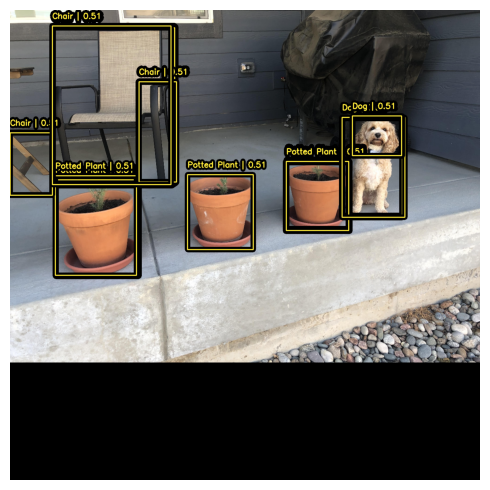

In [153]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.0, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 8

In [154]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7256297469139099 8 Chair
0.724902868270874 11 Dog
0.7248806953430176 8 Chair
0.724747359752655 11 Dog
0.7247290015220642 11 Dog
0.7217016816139221 11 Dog
0.7203531265258789 8 Chair
0.7199711799621582 8 Chair
0.7193955779075623 8 Chair
0.7157702445983887 11 Dog
0.7065445184707642 15 Potted Plant
0.7029543519020081 15 Potted Plant
0.7012025713920593 15 Potted Plant
0.698747456073761 8 Chair
0.6936407685279846 15 Potted Plant
0.6829439401626587 11 Dog
0.6800197958946228 8 Chair
0.6795817613601685 15 Potted Plant
0.6780174970626831 15 Potted Plant
0.6765194535255432 8 Chair
0.6664711833000183 8 Chair
0.666161298751831 8 Chair
0.6435891389846802 8 Chair
0.6357654333114624 8 Chair
0.6194080114364624 11 Dog
0.6154839992523193 8 Chair
0.6145841479301453 11 Dog
0.5862176418304443 8 Chair
0.5801294445991516 11 Dog
0.5759181380271912 15 Potted Plant
0.5753023028373718 15 Potted Plant
0.5705664753913879 15 P

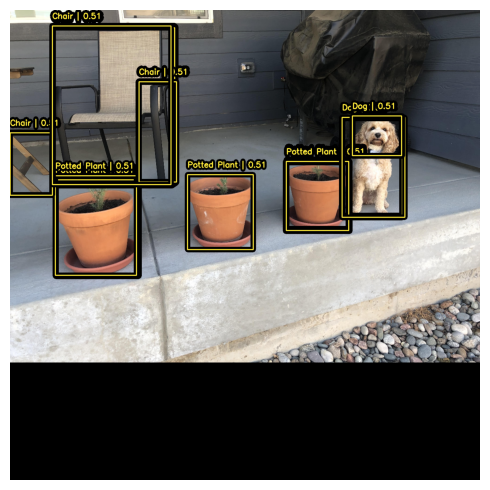

In [155]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=1.0, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 9

In [156]:
inference_resizing = keras_cv.layers.Resizing(
    1280, 1280, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7285498380661011 8 Chair
0.7279905080795288 11 Dog
0.7065445184707642 15 Potted Plant
0.6765194535255432 8 Chair
0.5506147742271423 8 Chair
0.5356166362762451 15 Potted Plant
0.5168814063072205 11 Dog
0.505652129650116 15 Potted Plant


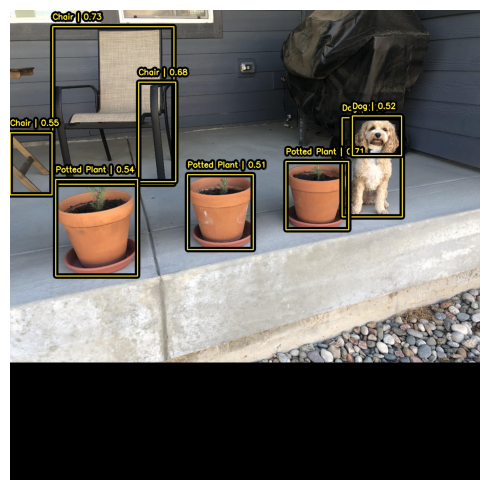

In [157]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.5, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 10

In [158]:
inference_resizing = keras_cv.layers.Resizing(
    2560, 2560, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
0.7234443426132202 11 Dog
0.7121996283531189 15 Potted Plant
0.711124837398529 15 Potted Plant
0.6624065637588501 16 Sheep
0.6219698190689087 15 Potted Plant
0.5796894431114197 16 Sheep
0.540526270866394 16 Sheep
0.5307990908622742 4 Bottle
0.522188127040863 11 Dog
0.5188908576965332 8 Chair
0.516140878200531 4 Bottle
0.5099230408668518 16 Sheep
0.5097154974937439 2 Bird
0.5092130899429321 4 Bottle
0.508461594581604 14 Person
0.507683515548706 16 Sheep
0.507655918598175 4 Bottle
0.507493257522583 7 Cat
0.5072629451751709 18 Train
0.5059647560119629 0 Aeroplane


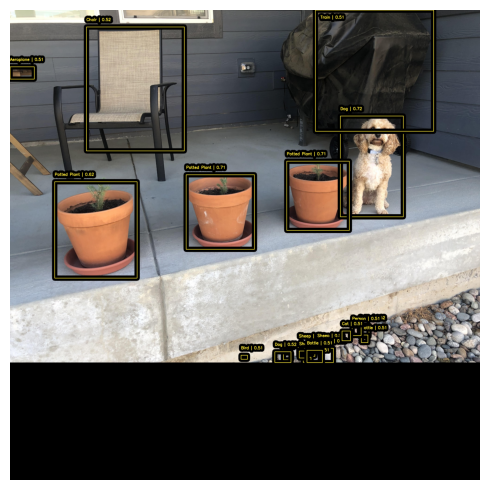

In [159]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.5, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 11

In [160]:
inference_resizing = keras_cv.layers.Resizing(
    2560, 2560, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7234443426132202 11 Dog
0.7121996283531189 15 Potted Plant
0.711124837398529 15 Potted Plant


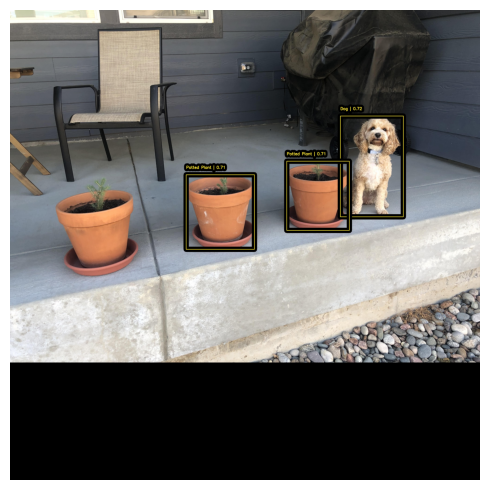

In [161]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 12

In [162]:
inference_resizing = keras_cv.layers.Resizing(
    2560, 2560, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
0.7234443426132202 11 Dog
0.7121996283531189 15 Potted Plant
0.711124837398529 15 Potted Plant
0.6624065637588501 16 Sheep
0.6219698190689087 15 Potted Plant


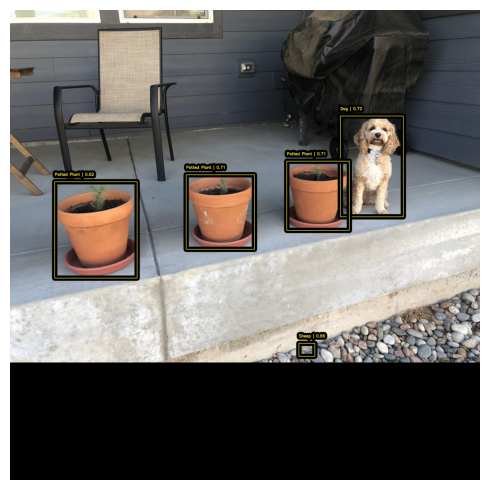

In [163]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.6, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 13

In [164]:
inference_resizing = keras_cv.layers.Resizing(
    2560, 2560, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
0.7234443426132202 11 Dog
0.7121996283531189 15 Potted Plant
0.711124837398529 15 Potted Plant
0.6624065637588501 16 Sheep
0.6219698190689087 15 Potted Plant
0.5796894431114197 16 Sheep
0.540526270866394 16 Sheep
0.5307990908622742 4 Bottle


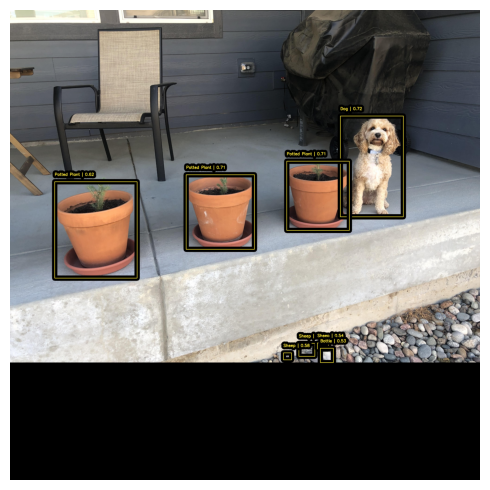

In [165]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.525, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 14

In [166]:
# https://github.com/ultralytics/ultralytics/issues/1376

# from ultralytics import YOLO
# from PIL import Image
# import numpy as np

# model = YOLO('path/to/model.pt')
# video_path = 'path/to/video.mp4'
# previous_boxes = []

# res = model.predict(source=video_path, stream=True)
# for frame_results in res:
#     current_boxes = frame_results.boxes.xyxy.cpu().numpy()
#     for box in current_boxes:
#         if not any(np.allclose(box, prev_box, atol=10) for prev_box in previous_boxes):
#             # This is a new detection
#             im = Image.fromarray(frame_results.orig_img)
#             imcrop = im.crop(box[:4])
#             imcrop.save(f"crop_{len(previous_boxes)}.jpg", "JPEG")
#             previous_boxes.append(box)


import torch

# https://github.com/ultralytics/ultralytics/issues/5163#issuecomment-1741469327
torch.save(pretrained_model, 'yolov8_me1.pt')
model = torch.load('yolov8_me1.pt')

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
0.7293508052825928 11 Dog
0.7261711359024048 15 Potted Plant
0.7231338024139404 15 Potted Plant
0.7166890501976013 15 Potted Plant
0.5266472697257996 8 Chair


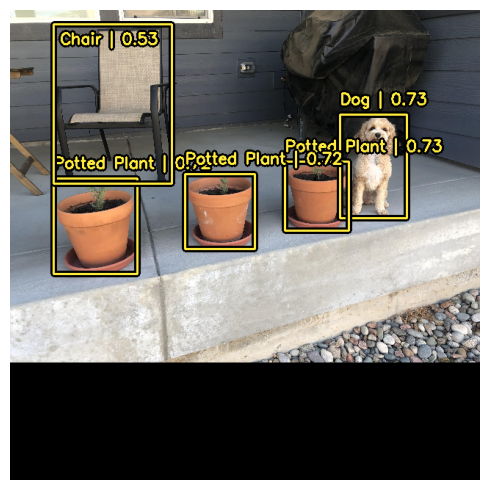

In [167]:
# ____________________________________________________________________________________________
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])
# ____________________________________________________________________________________________


prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.525, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 15

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7281444072723389 11 Dog
0.727109432220459 15 Potted Plant
0.7050243020057678 15 Potted Plant
0.7004843354225159 15 Potted Plant
0.5318573713302612 8 Chair


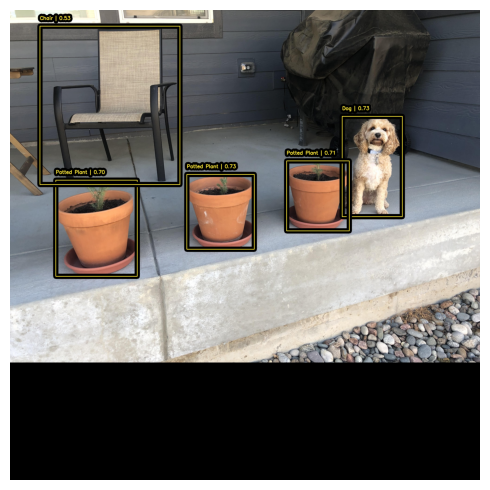

In [168]:
model = torch.load('yolov8_me1.pt')
# ____________________________________________________________________________________________
inference_resizing = keras_cv.layers.Resizing(
    2048, 2048, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])
# ____________________________________________________________________________________________


prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=False, # from_logits=True
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.505, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")

# Primer 16

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
0.7281444072723389 11 Dog
0.727109432220459 15 Potted Plant
0.7050243020057678 15 Potted Plant
0.7004843354225159 15 Potted Plant
0.5318573713302612 8 Chair


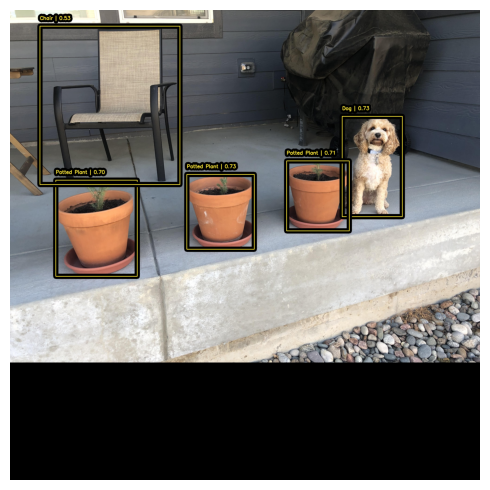

In [169]:
model = torch.load('yolov8_me1.pt')
# ____________________________________________________________________________________________
inference_resizing = keras_cv.layers.Resizing(
    2048, 2048, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])
# ____________________________________________________________________________________________


prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=False, # from_logits=True
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.2, # iou_threshold=0.2
    # Tune confidence threshold for predictions to pass NMS
    confidence_threshold=0.7, # confidence_threshold=0.7
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

for n in range(y_pred.get('num_detections')[0]):
  print(f"{y_pred.get('confidence')[0][n]} {y_pred.get('classes')[0][n]} {class_ids[y_pred.get('classes')[0][n]]}")